
**IMPORTING LIBRARIES**


In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import random
import os
import math
from tqdm import tqdm

**MOUNTING DRIVE**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


**SETTING DATAPATH**

In [ ]:
datapath = '/content/drive/MyDrive/Animals'

**LOADING IMAGES & STORING DATA**

In [ ]:
image_data=[]
for class_folder in os.listdir(datapath):
    class_path = os.path.join(datapath, class_folder)

    if os.path.isdir(class_path):
        for image in os.listdir(class_path):
            image_path = os.path.join(class_path, image)
            image_array = cv2.imread(image_path)
            image_rgb = cv2.cvtColor(image_array, cv2.COLOR_BGR2RGB)
            image_data.append((image_rgb, class_folder))

**RESIZING IMAGES**

In [ ]:
target_size = (224, 224)
resized_image_data = []
for image, label in image_data:
    resized_image = cv2.resize(image, target_size)
    resized_image_data.append((resized_image, label))

**CONVERTING TO GRAYSCALE**

In [ ]:
grayscale_image_data = []
for resized_image, label in resized_image_data:
    grayscale_image = cv2.cvtColor(resized_image, cv2.COLOR_RGB2GRAY)
    grayscale_image_data.append((grayscale_image, label))

**DISPLAYING 10 IMAGES FROM FIRST CLASS WITH LABELING**

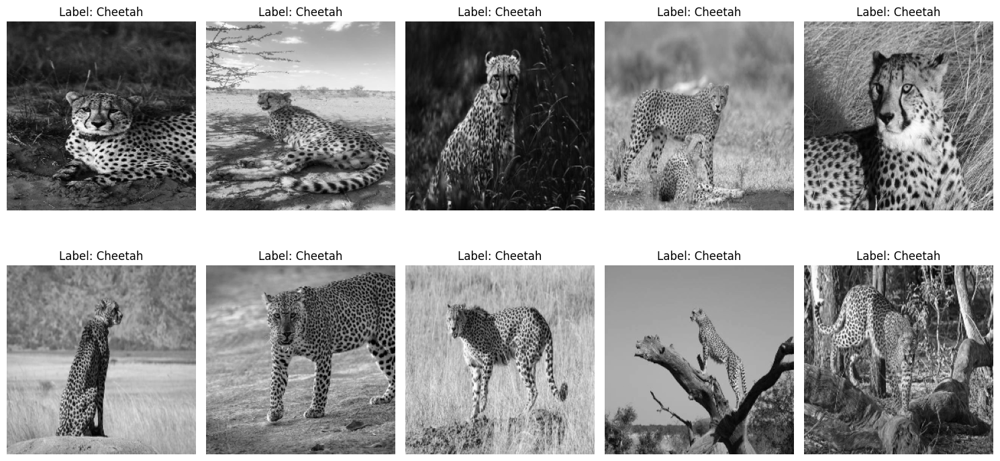

In [ ]:
plt.figure(figsize=(15, 8))

for i in range(10):
    grayscale_image, label = grayscale_image_data[i]
    plt.subplot(2, 5, i + 1)
    plt.imshow(grayscale_image, cmap='gray')
    plt.title(f"Label: {label}", fontsize=12)
    plt.axis('off')
plt.tight_layout()
plt.show()

**PRINTING SIZE**

In [ ]:
Dataset=grayscale_image_data
image=grayscale_image
print(len(Dataset))

170


**DISPLAYING ENTIRE DATASET AFTER SHUFFLING**

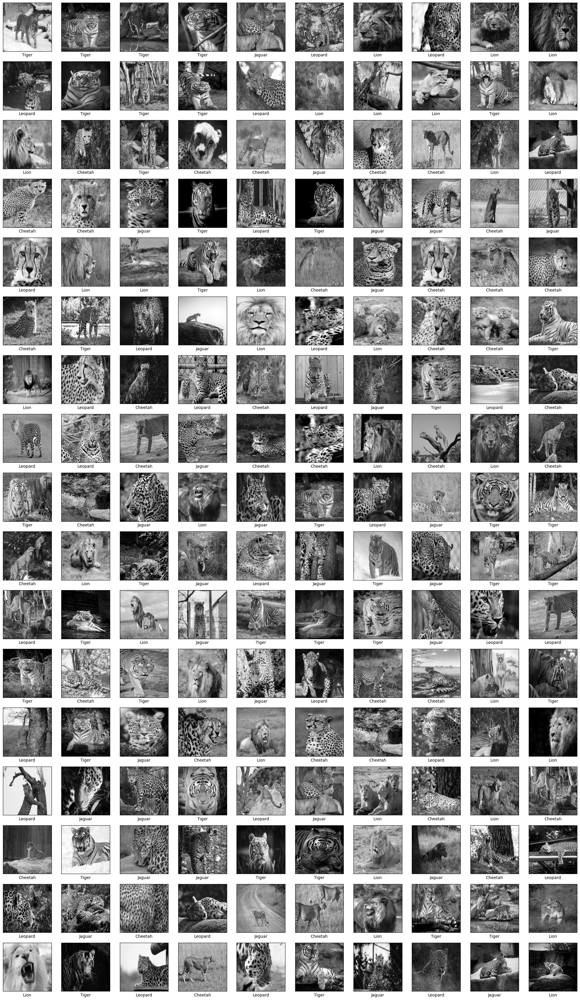

In [ ]:
random.shuffle(Dataset)

total_images = len(Dataset)
num_columns = 10
num_rows = math.ceil(total_images / num_columns)
plt.figure(figsize=(num_columns * 2, num_rows * 2))

for i in range(total_images):
    plt.subplot(num_rows, num_columns, i + 1)
    plt.imshow(Dataset[i][0], cmap='gray')
    plt.xticks([])
    plt.yticks([])
    plt.xlabel(Dataset[i][1])
plt.tight_layout()
plt.show()

**SPLITING INTO 5 FOLDS**

In [ ]:
num_folds = 5

fold_size = len(Dataset) // num_folds
folds = []

for i in range(num_folds):
    start_idx = i * fold_size
    end_idx = start_idx + fold_size
    if i == num_folds - 1:
        end_idx = len(Dataset)
    folds.append(Dataset[start_idx:end_idx])

for i, fold in enumerate(folds):
    print(f"Fold {i+1} contains {len(fold)} images.")

Fold 1 contains 34 images.
Fold 2 contains 34 images.
Fold 3 contains 34 images.
Fold 4 contains 34 images.
Fold 5 contains 34 images.


**SPLITING TRAIN-VALIDATION**

In [ ]:
for fold_idx in range(num_folds):
    validation_data = folds[fold_idx]
    train_data_combined = [item for i in range(num_folds) if i != fold_idx for item in folds[i]]

    num_rows_train = math.ceil(len(train_data_combined) / 10)

**PRINTING TRAIN-VALIDATION SIZES**

In [ ]:
print(len(train_data_combined))
print(len(validation_data))

136
34


**COMPUTING EUCLIDEAN DISTANCE & DISPLAYING THROUGH TABLE**

In [ ]:
import pandas as pd

def euclidean_distance(image1, image2):
  return np.sqrt(np.sum(np.square(image1 - image2)))

for fold_idx in range(num_folds):
    table_data = []
    validation_data = folds[fold_idx]
    train_data_combined = [item for i in range(num_folds) if i != fold_idx for item in folds[i]]

    print(f"Fold {fold_idx + 1} - Validation images: {len(validation_data)}, Training images: {len(train_data_combined)}")

    for val_img, val_label in validation_data:
        val_img_flattened = val_img.flatten()
        distances = []
        for train_img, train_label in train_data_combined:
            train_img_flattened = train_img.flatten()

            dist = euclidean_distance(val_img_flattened, train_img_flattened)
            distances.append(dist)

        table_data.append([val_label] + distances)

    df = pd.DataFrame(table_data, columns=['Validation Label'] + [f'Training Image [{i+1}]' for i in range(len(train_data_combined))])
    print(f"Fold {fold_idx + 1} Distance Table:")
    print(df)
    print("\n")


Fold 1 - Validation images: 34, Training images: 136
Fold 1 Distance Table:
   Validation Label  Training Image [1]  Training Image [2]  \
0             Tiger         2316.161696         2338.273081   
1             Tiger         2300.857014         2253.670562   
2             Tiger         2282.683509         2352.290798   
3             Tiger         2283.512645         2352.899913   
4            Jaguar         2303.960069         2292.526118   
5           Leopard         2294.283548         2317.550215   
6              Lion         2287.716766         2295.935975   
7           Leopard         2310.265353         2338.779596   
8              Lion         2292.189565         2325.013763   
9              Lion         2300.245422         2277.811011   
10          Leopard         2261.772093         2368.177992   
11            Tiger         2280.093858         2321.466347   
12            Tiger         2293.398570         2314.799127   
13            Tiger         2288.904323   

**PERFORMING K-NN CROSS-VALIDATION WITH AVERAGE ACCURACY**

In [ ]:
from collections import Counter

def knn_predict(distances, K):
    neighbors = [label for _, label in sorted(distances)[:K]]
    return Counter(neighbors).most_common(1)[0][0]

fold_accuracies = []
avg_accuracies = []

for K in range(1, 31):
    accuracies = []
    print(f"\nResults for K = {K}:\n")

    for i in range(len(folds)):
        valid_set = folds[i]
        train_set = [item for j, fold in enumerate(folds) if j != i for item in fold]
        predictions = []

        for val_img, val_label in valid_set:
            distances = []
            for train_img, train_label in train_set:
                dist = euclidean_distance(val_img, train_img)
                distances.append((dist, train_label))

            predicted_label = knn_predict(distances, K)
            predictions.append(1 if predicted_label == val_label else 0)

        fold_accuracy = sum(predictions) / len(predictions)
        accuracies.append(fold_accuracy)

        print(f"Fold {i+1} Accuracy: {fold_accuracy:.2f}")
    fold_accuracies.append(accuracies)
    avg_accuracy = sum(accuracies) / len(accuracies)
    avg_accuracies.append(avg_accuracy)
    print(f"Average Accuracy for K={K}: {avg_accuracy:.2f}")

print("\nFold Accuracies for each K:", fold_accuracies)
print("\nAverage Fold Accuracies for each K:", avg_accuracies)


Results for K = 1:

Fold 1 Accuracy: 0.32
Fold 2 Accuracy: 0.26
Fold 3 Accuracy: 0.32
Fold 4 Accuracy: 0.35
Fold 5 Accuracy: 0.26
Average Accuracy for K=1: 0.31

Results for K = 2:

Fold 1 Accuracy: 0.32
Fold 2 Accuracy: 0.26
Fold 3 Accuracy: 0.32
Fold 4 Accuracy: 0.35
Fold 5 Accuracy: 0.26
Average Accuracy for K=2: 0.31

Results for K = 3:

Fold 1 Accuracy: 0.35
Fold 2 Accuracy: 0.29
Fold 3 Accuracy: 0.21
Fold 4 Accuracy: 0.32
Fold 5 Accuracy: 0.26
Average Accuracy for K=3: 0.29

Results for K = 4:

Fold 1 Accuracy: 0.29
Fold 2 Accuracy: 0.26
Fold 3 Accuracy: 0.35
Fold 4 Accuracy: 0.29
Fold 5 Accuracy: 0.35
Average Accuracy for K=4: 0.31

Results for K = 5:

Fold 1 Accuracy: 0.29
Fold 2 Accuracy: 0.32
Fold 3 Accuracy: 0.32
Fold 4 Accuracy: 0.35
Fold 5 Accuracy: 0.29
Average Accuracy for K=5: 0.32

Results for K = 6:

Fold 1 Accuracy: 0.29
Fold 2 Accuracy: 0.32
Fold 3 Accuracy: 0.26
Fold 4 Accuracy: 0.32
Fold 5 Accuracy: 0.24
Average Accuracy for K=6: 0.29

Results for K = 7:

Fold 1 

**VISUALIZING CROSS-VALIDATION ACCURACY FOR K-NN**

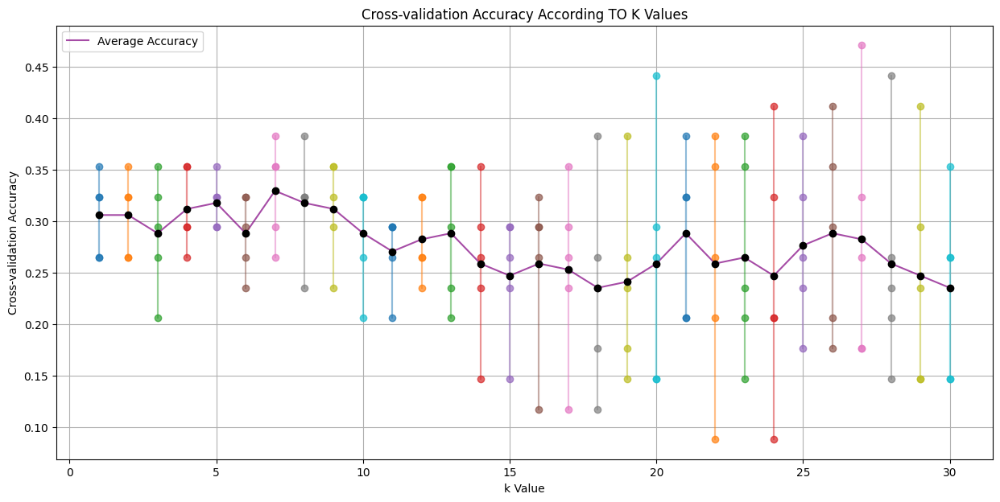

In [20]:
plt.figure(figsize=(15, 7))

for k, fold_accuracy in enumerate(fold_accuracies):
    plt.scatter([k + 1] * len(fold_accuracy), fold_accuracy, zorder=5, alpha=0.7)
    plt.plot([k + 1] * len(fold_accuracy), fold_accuracy, linestyle='-', alpha=0.5)

plt.plot(range(1, 31), avg_accuracies, color='purple', alpha=0.7, label='Average Accuracy')
plt.scatter(range(1, 31), avg_accuracies, color='black' , zorder=10)

plt.xlabel('k Value')
plt.ylabel('Cross-validation Accuracy')
plt.title('Cross-validation Accuracy According TO K Values')
plt.grid(True)

plt.legend()
plt.show()